<a href="https://colab.research.google.com/github/mahmedmushtaq/airbnb-scrapper/blob/master/ML_PROJECT_real_violence_lstm_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# import keras 
# from keras import applications
# from keras.preprocessing.image import ImageDataGenerator
# from keras import optimizers
# from keras.models import Sequential, Model 
# from keras.layers import Dropout, Dense, Flatten
# from keras.layers.convolutional_recurrent import ConvLSTM2D
# from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
import os
import cv2
import numpy as np
np.random.seed(1337) # just for reproducibility
import tensorflow
from tensorflow import keras
from tensorflow.keras import applications
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import Model, Sequential
import tensorflow.keras.layers
from tensorflow.keras.layers import Dropout, Dense, Flatten
from tensorflow.keras.layers import ConvLSTM2D
from sklearn.model_selection import train_test_split
import tensorflow.keras.metrics as km
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score

In [ ]:
import os
for dirname, _, filenames in os.walk("/content/drive/MyDrive/Project/Real Life Violence Dataset"):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [ ]:
data_dir = "/content/drive/MyDrive/Project/Real Life Violence Dataset"
img_height , img_width = 90, 90
seq_len = 40
 
classes = ["NonViolence", "Violence"]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#  Creating frames from videos
 
def frames_extraction(video_path):
    frames_list = []
     
    vidObj = cv2.VideoCapture(video_path)
    # Used as counter variable 
    count = 1
 
    while count <= seq_len: 
        success, image = vidObj.read() 
        if success:
            image = cv2.resize(image, (img_height, img_width))
            frames_list.append(image)
            count += 1
        else:
            print("Defected frame")
            break
 
            
    return frames_list

In [ ]:
def create_data(input_dir):
    X = []
    Y = []
     
    classes_list = os.listdir(input_dir)
     
    for c in classes_list:
        print(c)
        files_list = os.listdir(os.path.join(input_dir, c))
        for f in files_list[:600]:
            frames = frames_extraction(os.path.join(os.path.join(input_dir, c), f))
            if len(frames) == seq_len:
                X.append(frames)
             
                y = [0]*len(classes)
                y[classes.index(c)] = 1
                Y.append(y)
     
    X = np.asarray(X)
    Y = np.asarray(Y)
    return X, Y
 
X, Y = create_data(data_dir)

NonViolence
Defected frame
Violence


In [ ]:
print(np.shape(X))
print(np.shape(Y))

(1199, 40, 90, 90, 3)
(1199, 2)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, shuffle=True, random_state=1)

In [ ]:
model = Sequential()
model.add(ConvLSTM2D(filters = 72, kernel_size = (3, 3), return_sequences = False, data_format = "channels_last", input_shape = (seq_len, img_height, img_width, 3)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(254, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(2, activation = "softmax"))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 88, 88, 72)        194688    
                                                                 
 dropout (Dropout)           (None, 88, 88, 72)        0         
                                                                 
 flatten (Flatten)           (None, 557568)            0         
                                                                 
 dense (Dense)               (None, 254)               141622526 
                                                                 
 dropout_1 (Dropout)         (None, 254)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 510       
                                                                 
Total params: 141,817,724
Trainable params: 141,817,724


In [ ]:
opt = SGD(lr=0.001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=["accuracy"])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
history = model.fit(x=X_train, y=y_train, epochs=18, batch_size = 5,shuffle = False, validation_split=0.2)

In [ ]:
#  Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Colab Notebooks

/content/drive/MyDrive/Colab Notebooks


In [ ]:
model.save('./ML-project-violence-detection.h5')

In [ ]:
from IPython.display import FileLink
FileLink(r'/ML-project-violence-detection.h5')

/ML-project-violence-detection.h5

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
y_pred = np.argmax(y_pred, axis = 1)
y_test = np.argmax(y_test, axis = 1)

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.81      0.85       126
           1       0.81      0.89      0.85       114

    accuracy                           0.85       240
   macro avg       0.85      0.85      0.85       240
weighted avg       0.85      0.85      0.85       240



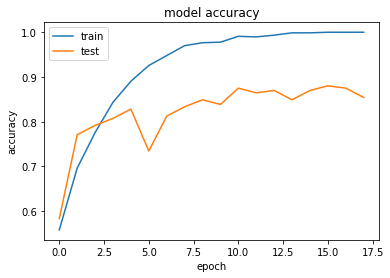

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

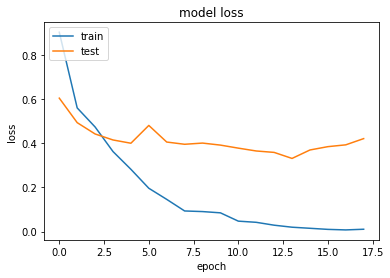

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss']) 
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
from keras.models import load_model
import cv2
import numpy as np

model = load_model('./ML-project-violence-detection.h5')

category =['NonViolence', 'Violence']
frames = frames_extraction("/content/drive/MyDrive/Colab Notebooks/V_999.mp4")
sequence = []
for image in s:
    sequence.append(image) 

prediction = model.predict(np.expand_dims(sequence, axis=0))
print(prediction)
queue.append(prediction)
results = np.array(queue).mean(axis=0)
i = category[np.argmax(results)]
print(i)

[[0.01965465 0.9803453 ]]
Violence


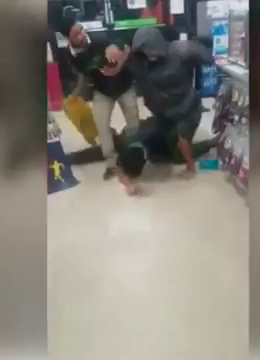

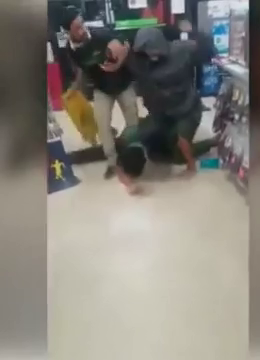

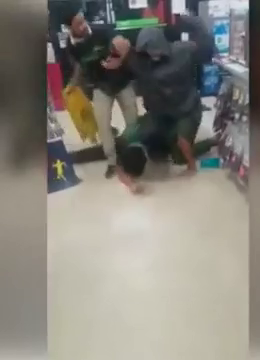

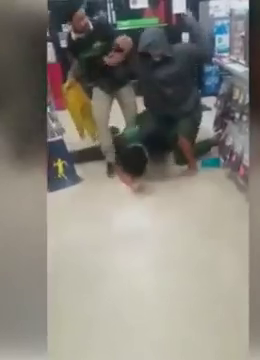

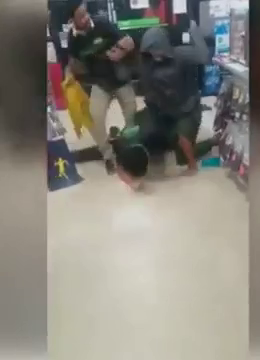

...

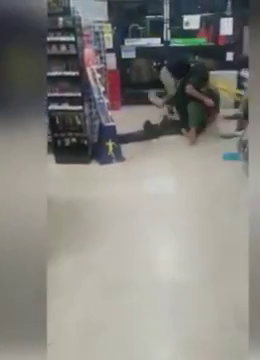

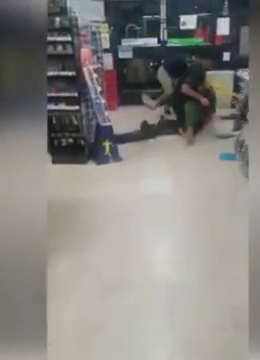

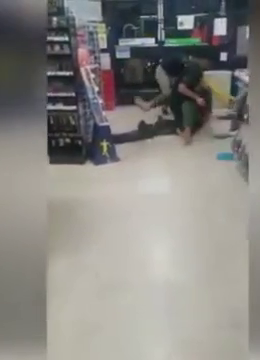

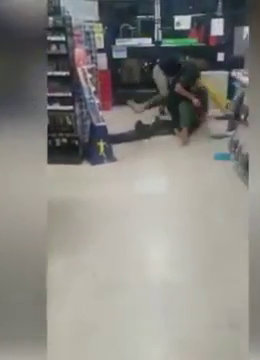

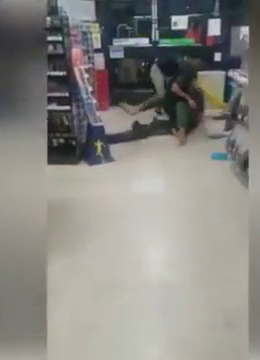

In [ ]:
from google.colab.patches import cv2_imshow
cap = cv2.VideoCapture("/content/drive/MyDrive/Colab Notebooks/V_999.mp4")
while(cap.isOpened()):
      
  # Capture frame-by-frame
  ret, frame = cap.read()
  if ret == True:
   
    # Display the resulting frame
    cv2_imshow(frame)
   
    # Press Q on keyboard to  exit
    if cv2.waitKey(25) & 0xFF == ord('q'):
      break
   
  # Break the loop
  else: 
    break
   
# When everything done, release 
# the video capture object
cap.release()
   
# Closes all the frames
cv2.destroyAllWindows()

[[0.01965465 0.9803453 ]]
Violence
